# Subsetting: the epithelial compartment

From `shiao.h5ad` (619,693 x 30,869, phase 01) to a raw, re-filtered object holding only the
cells whose CellTypist label belongs to the epithelium.

- subset `cell_type` on the 11 epithelial labels of the atlas (`LummHR-*`, `Lumsec-*`, `basal`) -
  the same group that 01_4 used to recode `fraction`; 10 of the 11 are observed here
- record the criterion in a new constant column, `compartment == 'epi'`
- restore `.X` = raw counts and drop every slot that phase 01 computed on the full object
  (PCA, UMAP, neighbours, HVG flags, scran size factors, leiden columns)
- drop the categories left empty by the subset (`cell_type` goes from 48 to 10 observed labels)
- recompute the QC metrics, re-apply the cell thresholds and re-run the gene filter
- drop the cohorts that no longer cover all three timepoints (0 cells in BASE, PD1 or RTPD1)
  **and** those left under 200 cells
- write `shiao_epi_raw.h5ad`, the input of `subsetting_all.sh`

Nothing is normalized here: scran runs in the next step, on this file, because its size
factors have to be estimated on the cells that remain.

This is 03_1 applied one lineage deeper. The non-immune compartment of 03 was 57% stromal and
vascular, so its HVGs, its PCA and its DRVI dimensions describe fibroblasts and endothelium as
much as epithelium; nothing of that phase is inherited here, the subset is taken from
`shiao.h5ad` again.

## Packages and paths

In [70]:
# Core scverse libraries
from __future__ import annotations

# Main
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.sparse as sp
import os

# Plotting
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sns

# Scanpy setting: clean white background and high resolution figures
sc.set_figure_params(dpi=300, facecolor="white")
# Set the level of verbosity of scanpy to get more detailed info
sc.settings.verbosity = 3

PHASE_DIR = os.path.dirname(os.getcwd())  # 04_drvi_epithelial/
REPO_ROOT = os.path.dirname(PHASE_DIR)

FIG_DIR = os.environ.get("FIG_DIR", os.path.join(PHASE_DIR, "figures", "04_1_subset_and_qc"))
os.makedirs(FIG_DIR, exist_ok=True)
sc.settings.figdir = FIG_DIR

print("cwd      :", os.getcwd())
print("REPO_ROOT:", REPO_ROOT)
print("FIG_DIR  :", FIG_DIR)

# Tell Juptyter to show all outputs and not only the last one
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

cwd      : /home/albertoc/Desktop/QCB-Master-Thesis/04_epithelial/04_1_subsetting
REPO_ROOT: /home/albertoc/Desktop/QCB-Master-Thesis
FIG_DIR  : /home/albertoc/Desktop/QCB-Master-Thesis/04_epithelial/figures/04_1_subset_and_qc


Setup the directory of the data. This is the path to the cluster data folder (outside the repo) or to
the local data folder, like in this case.
Raw and heavy intermediate objects live here; the repo holds only code and lightweight QC figures.

Everything this phase produces goes in its own `04_epi/` subfolder, so the epithelial chain never
gets confused with the whole-dataset one of 01 or the non-immune one of 03.

In [71]:
DATA_DIR = os.environ.get("DATA_DIR", "").strip() or "datasets"
DATA_DIR = os.path.abspath(os.path.join(REPO_ROOT, os.path.expanduser(DATA_DIR)))
os.environ["DATA_DIR"] = DATA_DIR  # absolute from now on: re-running this cell is a no-op

# Input: the definitive unintegrated object from 01_5
INPUT_H5AD = os.path.join(DATA_DIR, "shiao.h5ad")
if not os.path.exists(INPUT_H5AD):
    raise FileNotFoundError(
        f"input not found: {INPUT_H5AD}\n"
        f"(repo root {REPO_ROOT}: run this notebook from 04_1_subsetting/, or set DATA_DIR)"
    )
EPI_DIR = os.path.join(DATA_DIR, "04_epi")
OUTPUT_H5AD = os.path.join(EPI_DIR, "shiao_epi_raw.h5ad")
os.makedirs(EPI_DIR, exist_ok=True)

print("DATA_DIR:", DATA_DIR)
print("Input   :", INPUT_H5AD, f"({os.path.getsize(INPUT_H5AD) / 1024 ** 3:.2f} GB)")
print("Output  :", OUTPUT_H5AD)

DATA_DIR: /home/albertoc/Desktop/QCB-Master-Thesis/datasets
Input   : /home/albertoc/Desktop/QCB-Master-Thesis/datasets/shiao.h5ad (4.41 GB)
Output  : /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/shiao_epi_raw.h5ad


## Parameters

The cell thresholds are the same as 01_2. This is the place to make the epithelial compartment
stricter.

`MIN_CELLS = 3` is the one real change from 01_2, which used `min_cells=1`: on ~75k cells a gene
seen in one or two of them carries no usable signal and only inflates the denominator of the HVG
ranking and of the metrics.

Both cohort criteria are on here, unlike 03_1 where only the completeness one was. The epithelium
is 12% of the dataset and the per-patient counts fall much lower than in the non-immune
compartment (whose smallest cohort still had 314 cells): without a size threshold the smallest
batch would be Patient06 with 14 cells. `MIN_CELLS_PER_COHORT = 200` puts the floor back at 209
cells, the same regime 03 worked in, and costs 1,011 cells out of 75,452 (1.3%).

Scrublet is deliberately not re-run: doublet detection was done per biopsy on the full object,
where the mixture of lineages is what makes a doublet detectable in the first place. Re-running it
inside a single lineage would be worse, not better.

In [72]:
# The 11 epithelial labels of the CellTypist model annotated in 01_4 (Cells_Adult_Breast.pkl,
# Kumar et al. 2023, 58 labels): luminal hormone-responsive, luminal secretory and
# basal/myoepithelial. This is verbatim the "Epithelial" block of
# 01_4_cc_and_annotation/fraction_reassignment.py, where the same set is part of what makes a
# cell 'non_imm' - so this subset is, by construction, contained in the 03 compartment.
EPITHELIAL_CELL_TYPES = {
    # luminal hormone-responsive
    "LummHR-SCGB", "LummHR-active", "LummHR-major",
    # luminal secretory
    "Lumsec-HLA", "Lumsec-KIT", "Lumsec-basal", "Lumsec-lac", "Lumsec-major",
    "Lumsec-myo", "Lumsec-prol",
    # basal / myoepithelial
    "basal",
}

COMPARTMENT_KEY = "compartment"   # written by this notebook, constant 'epi'
COMPARTMENT_VALUE = "epi"

FRACTION_KEY = "fraction"       # from 01_4; constant 'non_imm' after this subset
BATCH_KEY = "cohort"
LABEL_KEY = "cell_type"
TREATMENT_KEY = "treatment"

MIN_CELLS = 3                   # gene filter: keep genes detected in >= MIN_CELLS cells
MIN_GENES = 100                 # cell filter: keep cells with n_genes_by_counts > MIN_GENES
MAX_PCT_MT = 10                 # cell filter: keep cells with pct_counts_mt < MAX_PCT_MT

MIN_CELLS_PER_COHORT = 200      # cohorts under this are dropped (see the census below)
DROP_SMALL_COHORTS = True       # on here, unlike 03_1: see the note above

REQUIRED_TREATMENTS = ("BASE", "PD1", "RTPD1")
DROP_INCOMPLETE_COHORTS = True  # drop cohorts with 0 cells in any of REQUIRED_TREATMENTS

## Load the full object

In [73]:
adata = ad.read_h5ad(INPUT_H5AD)
adata

AnnData object with n_obs × n_vars = 619693 × 30869
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'size_factors', 'S_score', 'G2M_score', 'phase', 'cell_type', 'celltypist_predicted', 'optscib_unintegrated_leiden_0.1', 'optscib_unintegrated_leiden_0.2', 'optscib_unintegrated_leiden_0.3', 'optscib_unintegrated_leiden_0.4', 'optscib_unintegrated_leiden_0.5', 'optscib_unintegrated_leiden_0.6', 'optscib_unintegrated_leiden_0.7', 'optscib_unintegrated_leiden_0.8', 'optscib_unintegrated_leiden_0.9', 'optscib_unintegrated_leiden_1.0', 'optscib_unintegrated_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts',

In [74]:
# What is inside the object
print("obs :", list(adata.obs.columns))
print("var :", list(adata.var.columns))
print("obsm:", list(adata.obsm), "| varm:", list(adata.varm), "| obsp:", list(adata.obsp))
print("uns :", list(adata.uns))
print("layers:", list(adata.layers))

obs : ['sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'size_factors', 'S_score', 'G2M_score', 'phase', 'cell_type', 'celltypist_predicted', 'optscib_unintegrated_leiden_0.1', 'optscib_unintegrated_leiden_0.2', 'optscib_unintegrated_leiden_0.3', 'optscib_unintegrated_leiden_0.4', 'optscib_unintegrated_leiden_0.5', 'optscib_unintegrated_leiden_0.6', 'optscib_unintegrated_leiden_0.7', 'optscib_unintegrated_leiden_0.8', 'optscib_unintegrated_leiden_0.9', 'optscib_unintegrated_leiden_1.0', 'optscib_unintegrated_leiden']
var : ['gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_c

## Subset: the epithelial compartment

In [75]:
# Guard before subsetting: a label in the set that the object does not carry would silently
# shrink the subset instead of raising. Reported, not asserted - the atlas has labels that are
# legitimately absent from this dataset (Lumsec-lac).
observed = set(adata.obs[LABEL_KEY].astype(str).unique())
absent = sorted(EPITHELIAL_CELL_TYPES - observed)
print(f"Epithelial labels: {len(EPITHELIAL_CELL_TYPES)} in the set, "
      f"{len(EPITHELIAL_CELL_TYPES) - len(absent)} observed in shiao.h5ad")
if absent:
    print("  not observed (0 cells in the whole dataset):", absent)

is_epi = adata.obs[LABEL_KEY].isin(EPITHELIAL_CELL_TYPES)

# Cross-check against `fraction`: 01_4 built the immune / non-immune recoding from the same
# label lists, so every epithelial cell must be 'non_imm'. A cell in the 'imm' column would mean
# the two lists have drifted apart and one of them is wrong.
print()
print(pd.crosstab(is_epi.rename("epithelial"), adata.obs[FRACTION_KEY]))
assert (adata.obs.loc[is_epi, FRACTION_KEY] == "non_imm").all(), \
    "an epithelial label is classified 'imm' in 01_4: the two label lists disagree"

adata.obs[LABEL_KEY].value_counts().loc[lambda s: s.index.isin(EPITHELIAL_CELL_TYPES)]

Epithelial labels: 11 in the set, 10 observed in shiao.h5ad
  not observed (0 cells in the whole dataset): ['Lumsec-lac']

fraction       imm  non_imm
epithelial                 
False       443083   101158
True             0    75452


cell_type
Lumsec-prol      24647
LummHR-major     18401
Lumsec-basal     17729
LummHR-SCGB       6000
basal             3317
Lumsec-major      1417
Lumsec-myo        1412
Lumsec-KIT        1344
LummHR-active     1088
Lumsec-HLA          97
Name: count, dtype: int64

In [76]:
n_before = adata.n_obs
epi = adata[is_epi].copy()
print(f"Cells: {n_before:,} -> {epi.n_obs:,} "
      f"({100 * epi.n_obs / n_before:.1f}% of the full object)")

# The criterion, recorded in the object itself. `fraction` cannot carry it: after this subset it
# is constant 'non_imm', exactly as it was in 03, so nothing in the file would distinguish this
# compartment from that one. A separate constant column makes it readable from the file alone.
epi.obs[COMPARTMENT_KEY] = pd.Categorical(
    [COMPARTMENT_VALUE] * epi.n_obs, categories=[COMPARTMENT_VALUE]
)
epi

Cells: 619,693 -> 75,452 (12.2% of the full object)


AnnData object with n_obs × n_vars = 75452 × 30869
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'size_factors', 'S_score', 'G2M_score', 'phase', 'cell_type', 'celltypist_predicted', 'optscib_unintegrated_leiden_0.1', 'optscib_unintegrated_leiden_0.2', 'optscib_unintegrated_leiden_0.3', 'optscib_unintegrated_leiden_0.4', 'optscib_unintegrated_leiden_0.5', 'optscib_unintegrated_leiden_0.6', 'optscib_unintegrated_leiden_0.7', 'optscib_unintegrated_leiden_0.8', 'optscib_unintegrated_leiden_0.9', 'optscib_unintegrated_leiden_1.0', 'optscib_unintegrated_leiden', 'compartment'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 

In [77]:
del adata

In [78]:
# The composition this phase will work with, before any further filtering.
print("Cells per cell_type:")
print(epi.obs[LABEL_KEY].value_counts().loc[lambda s: s > 0])
print("\nCells per cohort x treatment:")
pd.crosstab(epi.obs[BATCH_KEY], epi.obs["treatment"])

Cells per cell_type:
cell_type
Lumsec-prol      24647
LummHR-major     18401
Lumsec-basal     17729
LummHR-SCGB       6000
basal             3317
Lumsec-major      1417
Lumsec-myo        1412
Lumsec-KIT        1344
LummHR-active     1088
Lumsec-HLA          97
Name: count, dtype: int64

Cells per cohort x treatment:


treatment,BASE,PD1,RTPD1
cohort,,,
Patient01,390,0,152
Patient02,63,82,64
Patient03,195,8,31
Patient04,117,21,54
Patient05,80,250,46
Patient06,5,3,6
Patient07,139,54,64
Patient09,279,149,43
Patient10,846,484,319


## Restore the raw counts and drop the phase-01 global slots

`.X` in `shiao.h5ad` is the scran log-normalized matrix of the full object: its size factors were
deconvolved from pools of 619,693 cells and do not describe this subset. `.layers['counts']` is the
only matrix that survives a subset unchanged, so it becomes `.X` again and
`scran_norm_epi.py` re-normalizes from there.

The same argument applies to everything else phase 01 derived: the PCA was computed on HVGs selected
across a population 88% of which was not epithelial, the neighbour graph and the UMAP on that PCA, the leiden columns
on that graph. Keeping any of it would be worse than useless - `use_rep='X_pca'` downstream would
silently point at the old embedding.

In [79]:
# Raw counts back in .X (kept in .layers['counts'] as well, untouched)
counts = epi.layers["counts"]
epi.X = counts.copy()
if sp.issparse(epi.X) and not sp.isspmatrix_csr(epi.X):
    epi.X = epi.X.tocsr()

x_values = epi.X.data if sp.issparse(epi.X) else np.asarray(epi.X).ravel()
print("dtype:", epi.X.dtype, "| integer values:", bool(np.allclose(x_values, np.round(x_values))))
print("min:", x_values.min(), "| max:", x_values.max())

dtype: float32 | integer values: True
min: 1.0 | max: 11105.0


In [80]:
# Drop the derived matrices and graphs
for key in list(epi.obsm):
    print("removing obsm:", key); del epi.obsm[key]
for key in list(epi.varm):
    print("removing varm:", key); del epi.varm[key]
for key in list(epi.obsp):
    print("removing obsp:", key); del epi.obsp[key]

# Drop the derived .uns entries: the graph/embedding parameters, the leiden run parameters
# of 01_5, and the *_colors palettes.
UNS_DROP = ("neighbors", "umap", "pca", "hvg", "log1p")
for key in list(epi.uns):
    if key in UNS_DROP or key.endswith("_colors") or key.startswith("optscib_"):
        print("removing uns:", key); del epi.uns[key]
print("\nkept uns:", list(epi.uns))

removing obsm: X_pca
removing obsm: X_umap
removing varm: PCs
removing obsp: connectivities
removing obsp: distances
removing uns: cell_type_colors
removing uns: dataset_origin_colors
removing uns: log1p
removing uns: neighbors
removing uns: optscib_unintegrated_leiden_0.1
removing uns: optscib_unintegrated_leiden_0.2
removing uns: optscib_unintegrated_leiden_0.3
removing uns: optscib_unintegrated_leiden_0.4
removing uns: optscib_unintegrated_leiden_0.5
removing uns: optscib_unintegrated_leiden_0.6
removing uns: optscib_unintegrated_leiden_0.7
removing uns: optscib_unintegrated_leiden_0.8
removing uns: optscib_unintegrated_leiden_0.9
removing uns: optscib_unintegrated_leiden_1.0
removing uns: pca
removing uns: umap

kept uns: []


In [81]:
# Drop the derived .obs columns: scran size factors, the leiden sweep of 01_5, and the cell
# cycle scores.
obs_drop = [c for c in epi.obs.columns
            if c == "size_factors"
            or c.startswith("optscib_unintegrated_leiden")
            or c in ("S_score", "G2M_score", "phase")]
print("dropping obs:", obs_drop)
epi.obs = epi.obs.drop(columns=obs_drop)

# Drop the derived .var columns: the batch-aware HVG selection of 01_5 and the per-gene QC
# statistics of 01_2, all computed on the full object. QC is recomputed below; the HVGs are
# reselected in reduce_data_epi.py. Everything else ('gene_ids', 'feature_types',
# 'genome': the annotation that came with the counts) stays.
VAR_DROP = {
    # per-gene QC from 01_2
    "n_cells", "n_cells_by_counts", "mean_counts", "log1p_mean_counts",
    "pct_dropout_by_counts", "total_counts", "log1p_total_counts",
    "mt", "ribo",
    # batch-aware HVG selection from 01_5
    "highly_variable", "highly_variable_nbatches", "highly_variable_intersection",
    "means", "dispersions", "dispersions_norm",
}
var_drop = [c for c in epi.var.columns if c in VAR_DROP]
print("dropping var:", var_drop)
print("keeping var :", [c for c in epi.var.columns if c not in VAR_DROP])
epi.var = epi.var.drop(columns=var_drop)
epi

dropping obs: ['size_factors', 'S_score', 'G2M_score', 'phase', 'optscib_unintegrated_leiden_0.1', 'optscib_unintegrated_leiden_0.2', 'optscib_unintegrated_leiden_0.3', 'optscib_unintegrated_leiden_0.4', 'optscib_unintegrated_leiden_0.5', 'optscib_unintegrated_leiden_0.6', 'optscib_unintegrated_leiden_0.7', 'optscib_unintegrated_leiden_0.8', 'optscib_unintegrated_leiden_0.9', 'optscib_unintegrated_leiden_1.0', 'optscib_unintegrated_leiden']
dropping var: ['mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable']
keeping var : ['gene_ids', 'feature_types', 'genome']


AnnData object with n_obs × n_vars = 75452 × 30869
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'cell_type', 'celltypist_predicted', 'compartment'
    var: 'gene_ids', 'feature_types', 'genome'
    layers: 'counts', None (.X)

### Categories left empty by the subset

`cell_type` is a categorical with the 48 labels observed in the full object; after the subset only the
epithelial ones carry cells. Empty categories are not cosmetic: they end up in the NMI computation of
the leiden sweep, in every `groupby`, and in the legends of every figure.

In [82]:
for col in epi.obs.columns:
    if isinstance(epi.obs[col].dtype, pd.CategoricalDtype):
        before = len(epi.obs[col].cat.categories)
        epi.obs[col] = epi.obs[col].cat.remove_unused_categories()
        after = len(epi.obs[col].cat.categories)
        if before != after:
            print(f"{col}: {before} -> {after} categories")

print("\nObserved labels:", epi.obs[LABEL_KEY].nunique())
print("Observed batches:", epi.obs[BATCH_KEY].nunique())
print("compartment:", epi.obs[COMPARTMENT_KEY].cat.categories.tolist(),
      "| fraction:", epi.obs[FRACTION_KEY].cat.categories.tolist())
print("(both constant by construction: neither is usable as a covariate downstream)")


Observed labels: 10
Observed batches: 34
compartment: ['epi'] | fraction: ['non_imm']
(both constant by construction: neither is usable as a covariate downstream)


## Quality control metrics, recomputed

The QC columns inherited from 01_2 describe the full gene set of the full object. `total_counts` and
`n_genes_by_counts` are per-cell sums, so they are unchanged by removing *cells*, but they will change
as soon as genes are dropped below - and the mitochondrial and ribosomal flags have to be rebuilt on
the current `.var` anyway.

In [83]:
epi.var["mt"] = np.asarray(epi.var_names.str.startswith("MT-"), dtype=bool)
epi.var["ribo"] = np.asarray(epi.var_names.str.startswith(("RPS", "RPL")), dtype=bool)

sc.pp.calculate_qc_metrics(
    epi,
    qc_vars=["mt", "ribo"],
    inplace=True,
    percent_top=None,
    log1p=True,
)
print("MT genes flagged  :", int(epi.var["mt"].sum()))
print("Ribo genes flagged:", int(epi.var["ribo"].sum()))
epi.obs[["total_counts", "n_genes_by_counts", "pct_counts_mt", "pct_counts_ribo"]].describe()

MT genes flagged  : 13
Ribo genes flagged: 102


,total_counts,n_genes_by_counts,pct_counts_mt,pct_counts_ribo
count,75452.000000,75452.000000,75452.000000,75452.000000
mean,5984.784668,1725.675714,4.130744,20.609865
std,8062.797852,1392.337723,2.703843,9.708232
min,119.000000,102.000000,0.000000,0.418994
25%,1115.000000,641.000000,1.873117,13.919840
50%,2774.000000,1259.000000,4.135848,19.038011
75%,7436.000000,2407.000000,6.086201,24.902471
max,84662.000000,9355.000000,9.998501,77.197800


### QC figures (before the cell filter)

Two figures per round: a clean one, readable, and a jittered one that shows where the
cells actually sit. Same panels as 01_2, plus `pct_counts_ribo`.


wrote violin_epi_qc_before_filter_unintegrated.png


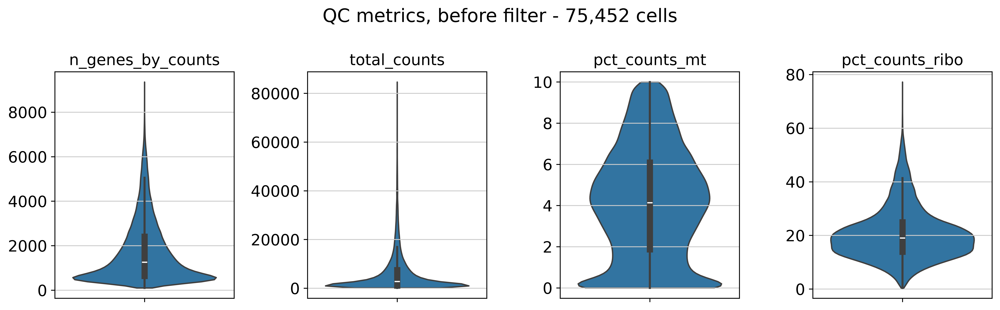

wrote violin_epi_qc_before_filter_unintegrated_jitter.png


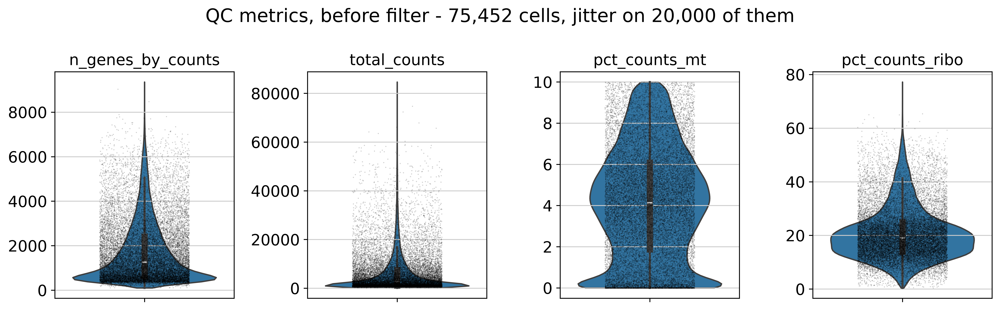

In [84]:
QC_METRICS = ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"]
STRIP_MAX_POINTS = 20000

def violin_qc(obs, stage, suffix="epi", metrics=QC_METRICS, max_points=STRIP_MAX_POINTS):
    """Write violin_<suffix>_qc_<stage>_unintegrated[_jitter].png to FIG_DIR."""
    rng = np.random.default_rng(0)
    if len(obs) > max_points:
        strip_obs = obs.iloc[np.sort(rng.choice(len(obs), size=max_points, replace=False))]
    else:
        strip_obs = obs

    for jitter in (False, True):
        fig, axes = plt.subplots(1, len(metrics), figsize=(3.2 * len(metrics), 4))
        for ax, metric in zip(np.atleast_1d(axes), metrics):
            sns.violinplot(data=obs, y=metric, ax=ax, color="tab:blue", cut=0)
            if jitter:
                sns.stripplot(data=strip_obs, y=metric, ax=ax, color="black",
                              size=1, alpha=0.2, jitter=0.25)
            ax.set_xlabel("")
            ax.set_ylabel("")
            ax.set_title(metric)

        head = f"QC metrics, {stage.replace('_', ' ')} - {len(obs):,} cells"
        fig.suptitle(head + (f", jitter on {len(strip_obs):,} of them" if jitter else ""))
        fig.tight_layout()
        name = f"violin_{suffix}_qc_{stage}_unintegrated{'_jitter' if jitter else ''}.png"
        fig.savefig(os.path.join(FIG_DIR, name), dpi=300, bbox_inches="tight")
        print("wrote", name)
        plt.show()

violin_qc(epi.obs, "before_filter")

/tmp/ipykernel_14043/3526887795.py:2: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.scatter(


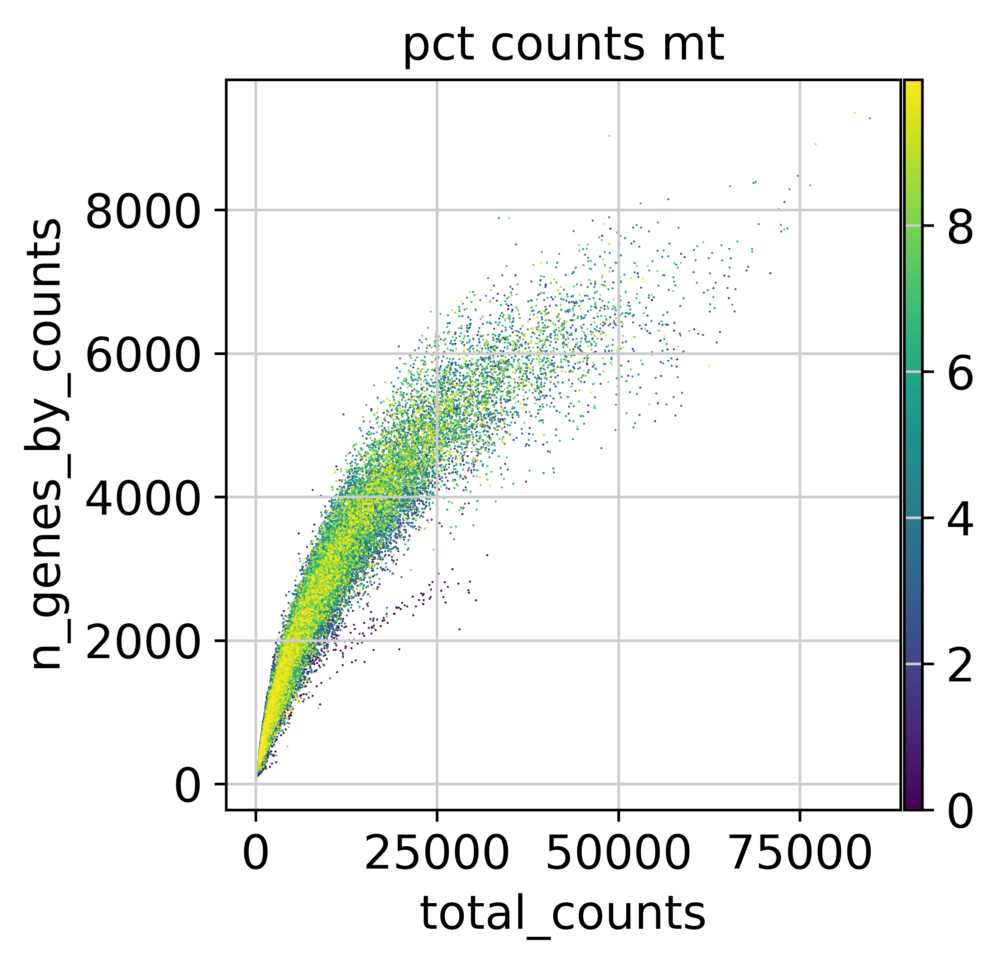

In [85]:
# The usual complexity scatter: counts vs genes, colored by mitochondrial content.
sc.pl.scatter(
    epi,
    x="total_counts",
    y="n_genes_by_counts",
    color="pct_counts_mt",
    save="_epi_counts_vs_genes_unintegrated.png",
)

## Cell filter

Same criteria as 01_2 (`pct_counts_mt < 10`, `n_genes_by_counts > 100`), re-applied rather than
assumed: the report below is the evidence that the subset carries no cell that the full-object filter
would have rejected, and the place to tighten `MIN_GENES` / `MAX_PCT_MT` if the figures above call
for it.

In [86]:
n_before = epi.n_obs
keep = (
    (epi.obs["pct_counts_mt"] < MAX_PCT_MT) &
    (epi.obs["n_genes_by_counts"] > MIN_GENES)
)
print("Cells removed by each criterion (marginal, not mutually exclusive):")
print(f"  pct_mt >= {MAX_PCT_MT}   : {int((epi.obs['pct_counts_mt'] >= MAX_PCT_MT).sum()):,}")
print(f"  n_genes <= {MIN_GENES}  : {int((epi.obs['n_genes_by_counts'] <= MIN_GENES).sum()):,}")

epi = epi[keep].copy()
print(f"\nCells: {n_before:,} -> {epi.n_obs:,} ({100 * epi.n_obs / n_before:.1f}% retained)")

Cells removed by each criterion (marginal, not mutually exclusive):
  pct_mt >= 10   : 0
  n_genes <= 100  : 0

Cells: 75,452 -> 75,452 (100.0% retained)


## Gene filter

Placed after the cell filter, as in 01_2. Two reasons rather than one here: zero-count genes break
scran's `computeSumFactors`, and the 30,869 genes of the full object include everything that was only
expressed in the 544,241 non-epithelial cells that just left - immune and stromal alike.

In [87]:
n_genes_before = epi.n_vars
detected = np.asarray((epi.X > 0).sum(axis=0)).ravel()
print(f"Total number of genes: {n_genes_before:,}")
print(f"  detected in 0 cells        : {int((detected == 0).sum()):,}")
print(f"  detected in < {MIN_CELLS} cells  : {int((detected < MIN_CELLS).sum()):,}")

sc.pp.filter_genes(epi, min_cells=MIN_CELLS)
print(f"Genes after the filter: {epi.n_vars:,} "
      f"({100 * epi.n_vars / n_genes_before:.1f}% retained)")

Total number of genes: 30,869
  detected in 0 cells        : 1,986
  detected in < 3 cells  : 4,442
filtered out 4442 genes that are detected in less than 3 cells
Genes after the filter: 26,427 (85.6% retained)


### QC figures (after the cell and gene filters)


wrote violin_epi_qc_after_cell_and_gene_filter_unintegrated.png


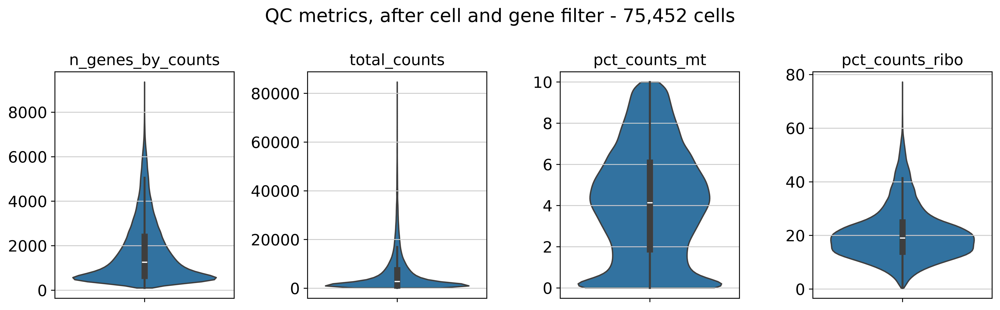

wrote violin_epi_qc_after_cell_and_gene_filter_unintegrated_jitter.png


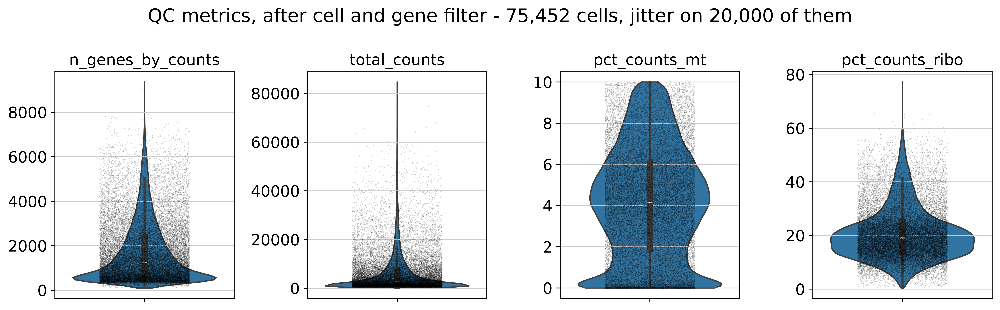

In [88]:
violin_qc(epi.obs, "after_cell_and_gene_filter")

## Batch census

`cohort` is the batch key of everything downstream: scib's `hvg_batch` selects genes per patient
before merging, and DRVI is trained with `dispersion='gene-batch'`, which fits a dispersion per gene
*and* per batch. Both degrade on a patient contributing a few hundred cells - and on the epithelium
several patients contribute far less than that.

Both criteria are on here (in 03_1 only the second was):

- **size** (`DROP_SMALL_COHORTS`, on): cohorts under `MIN_CELLS_PER_COHORT = 200` cells. Measured
  on the full object before the QC filters, the epithelial counts per patient span 14 to 9,243,
  and the three cohorts below the threshold - Patient06 (14), Patient23 (176), Patient04 (192) -
  are 368 cells in total. A 14-cell batch is a dispersion column fitted on nothing.
- **completeness** (`DROP_INCOMPLETE_COHORTS`, on): cohorts with 0 epithelial cells in any of
  BASE / PD1 / RTPD1. The design of this dataset is longitudinal - the same patient sampled at the
  three timepoints - and a cohort covering only part of them cannot contribute to the treatment
  contrast this phase is about, while it still costs a full batch in the integration and a
  dispersion column in DRVI. Patient01 (no PD1) and Patient30 (no RTPD1) fall here.

Note that both are judged *after* the QC filters above: a cohort can lose a timepoint, or fall
under the threshold, here rather than in the full object.

In [89]:
cells_per_cohort = epi.obs[BATCH_KEY].value_counts()
print(f"{cells_per_cohort.size} cohorts | "
      f"min {cells_per_cohort.min():,} ({cells_per_cohort.idxmin()}) | "
      f"median {int(cells_per_cohort.median()):,} | "
      f"max {cells_per_cohort.max():,} ({cells_per_cohort.idxmax()})")

small = cells_per_cohort[cells_per_cohort < MIN_CELLS_PER_COHORT]
if len(small):
    print(f"\n{len(small)} cohort(s) below {MIN_CELLS_PER_COHORT} cells:")
    print(small)
else:
    print(f"\nNo cohort below {MIN_CELLS_PER_COHORT} cells.")

cells_per_cohort.sort_values()

34 cohorts | min 14 (Patient06) | median 1,170 | max 9,243 (Patient52)

4 cohort(s) below 200 cells:
cohort
Patient04    192
Patient23    176
Patient30     87
Patient06     14
Name: count, dtype: int64


cohort
Patient06      14
Patient30      87
Patient23     176
Patient04     192
Patient02     209
Patient66     214
Patient20     218
Patient03     234
Patient12     241
Patient07     257
Patient05     376
Patient09     471
Patient64     502
Patient01     542
Patient15     549
Patient42     619
Patient18    1148
Patient48    1192
Patient11    1193
Patient19    1399
Patient57    1509
Patient39    1633
Patient10    1649
Patient45    2434
Patient46    2950
Patient17    3038
Patient47    3922
Patient43    5394
Patient53    5488
Patient26    5815
Patient56    6745
Patient63    7771
Patient16    8028
Patient52    9243
Name: count, dtype: int64

In [90]:
cohort_x_treatment = pd.crosstab(
    epi.obs[BATCH_KEY], epi.obs[TREATMENT_KEY]
).reindex(columns=list(REQUIRED_TREATMENTS), fill_value=0)

incomplete = cohort_x_treatment.index[(cohort_x_treatment == 0).any(axis=1)]
if len(incomplete):
    print(f"{len(incomplete)} cohort(s) missing at least one of "
          f"{'/'.join(REQUIRED_TREATMENTS)}:")
    for c in incomplete:
        missing = [t for t in REQUIRED_TREATMENTS if cohort_x_treatment.loc[c, t] == 0]
        print(f"  {c}: no {'/'.join(missing)} ({int(cells_per_cohort[c]):,} cells)")
else:
    print(f"Every cohort covers all of {'/'.join(REQUIRED_TREATMENTS)}.")

cohort_x_treatment

2 cohort(s) missing at least one of BASE/PD1/RTPD1:
  Patient01: no PD1 (542 cells)
  Patient30: no RTPD1 (87 cells)


treatment,BASE,PD1,RTPD1
cohort,,,
Patient01,390,0,152
Patient02,63,82,64
Patient03,195,8,31
Patient04,117,21,54
Patient05,80,250,46
Patient06,5,3,6
Patient07,139,54,64
Patient09,279,149,43
Patient10,846,484,319


In [91]:
to_drop = pd.Index([])
if DROP_SMALL_COHORTS:
    to_drop = to_drop.union(small.index)
if DROP_INCOMPLETE_COHORTS:
    to_drop = to_drop.union(incomplete)

if len(to_drop):
    reasons = {c: [] for c in to_drop}
    for c in to_drop:
        if DROP_SMALL_COHORTS and c in small.index:
            reasons[c].append(f"< {MIN_CELLS_PER_COHORT} cells")
        if DROP_INCOMPLETE_COHORTS and c in incomplete:
            missing = [t for t in REQUIRED_TREATMENTS if cohort_x_treatment.loc[c, t] == 0]
            reasons[c].append("no " + "/".join(missing))
    print(f"Dropping {len(to_drop)} cohort(s):")
    for c in to_drop:
        print(f"  {c}: {'; '.join(reasons[c])} ({int(cells_per_cohort[c]):,} cells)")

    n_before, n_cohorts_before = epi.n_obs, epi.obs[BATCH_KEY].nunique()
    epi = epi[~epi.obs[BATCH_KEY].isin(to_drop)].copy()

    # Every categorical can lose a level with a whole patient (sample, response, and the
    # cell types only that patient carried), not just the batch key.
    for col in epi.obs.columns:
        if isinstance(epi.obs[col].dtype, pd.CategoricalDtype):
            epi.obs[col] = epi.obs[col].cat.remove_unused_categories()

    print(f"\nCells   : {n_before:,} -> {epi.n_obs:,} "
          f"({100 * epi.n_obs / n_before:.1f}% retained)")
    print(f"Cohorts : {n_cohorts_before} -> {epi.obs[BATCH_KEY].nunique()}")

    # Genes can fall below the threshold once a whole patient is gone; zero-count ones would
    # break scran, so this refilter is not optional.
    n_genes_before = epi.n_vars
    sc.pp.filter_genes(epi, min_cells=MIN_CELLS)
    print(f"Genes   : {n_genes_before:,} -> {epi.n_vars:,}")

    # QC columns are per-cell sums over the genes that are actually left.
    sc.pp.calculate_qc_metrics(
        epi, qc_vars=["mt", "ribo"], inplace=True, percent_top=None, log1p=True,
    )
    print("\nCohort x treatment after the drop:")
    print(pd.crosstab(epi.obs[BATCH_KEY], epi.obs[TREATMENT_KEY]))
else:
    print("No cohort dropped (both criteria are off, or nothing meets them).")

Dropping 5 cohort(s):
  Patient01: no PD1 (542 cells)
  Patient04: < 200 cells (192 cells)
  Patient06: < 200 cells (14 cells)
  Patient23: < 200 cells (176 cells)
  Patient30: < 200 cells; no RTPD1 (87 cells)



Cells   : 75,452 -> 74,441 (98.7% retained)
Cohorts : 34 -> 29
filtered out 56 genes that are detected in less than 3 cells
Genes   : 26,427 -> 26,371

Cohort x treatment after the drop:
treatment  BASE   PD1  RTPD1
cohort                      
Patient02    63    82     64
Patient03   195     8     31
Patient05    80   250     46
Patient07   139    54     64
Patient09   279   149     43
Patient10   846   484    319
Patient11   743   420     30
Patient12    17    76    148
Patient15    55   250    244
Patient16   739  7209     80
Patient17   284   252   2502
Patient18   205   899     44
Patient19   395   396    608
Patient20    78   127     13
Patient26  3984  1803     28
Patient39   187  1429     17
Patient42   311   282     26
Patient43   139  3770   1485
Patient45   561  1807     66
Patient46  1408  1450     92
Patient47  1439  2034    449
Patient48   500   641     51
Patient52  5098  3343    802
Patient53  1645  2914    929
Patient56  2052  3695    998
Patient57   264  1082    163


### QC figures (after the cohort drops)

The last round: the cells of the dropped cohorts are gone, the gene filter has run a second time
and the QC columns have been recomputed over the genes that are actually left. These are the
distributions of the object that gets written.

wrote violin_epi_qc_after_cohort_drop_unintegrated.png


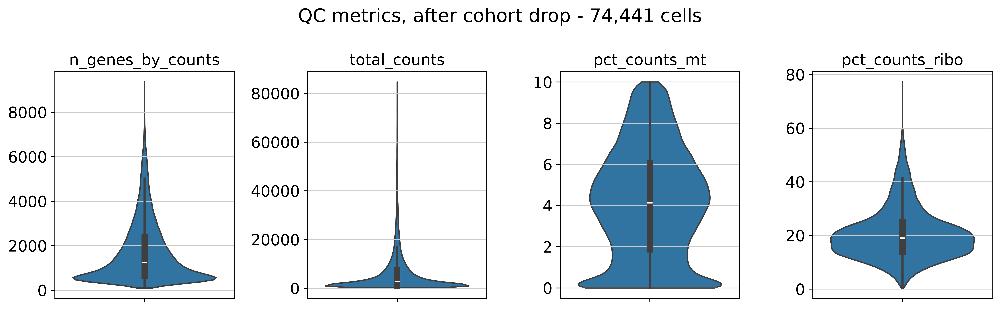

wrote violin_epi_qc_after_cohort_drop_unintegrated_jitter.png


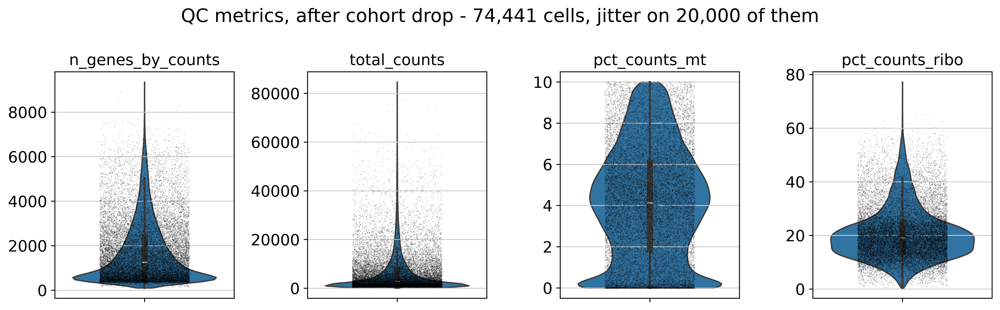

In [92]:
if len(to_drop):
    violin_qc(epi.obs, "after_cohort_drop")
else:
    print("no cohort dropped: the round above is already the final one")

In [93]:
# Post-conditions, checked before writing rather than discovered by scran an hour later.
counts_values = epi.layers["counts"].data
x_values = epi.X.data
assert np.allclose(x_values, np.round(x_values)), ".X must hold raw integer counts"
assert np.array_equal(x_values, counts_values), ".X and layers['counts'] must be identical here"
assert int(np.asarray(epi.X.sum(axis=0) == 0).sum()) == 0, "zero-count genes left; scran would fail"
assert "size_factors" not in epi.obs, "the phase-01 size factors are still here"
assert not epi.obsm and not epi.varm and not epi.obsp, "a derived slot survived"

# The subset itself: only epithelial labels, and the compartment column that records it.
assert set(epi.obs[LABEL_KEY].astype(str).unique()) <= EPITHELIAL_CELL_TYPES, \
    "a non-epithelial label survived the subset"
assert epi.obs[COMPARTMENT_KEY].nunique() == 1, "the compartment column is not constant"
assert epi.obs[FRACTION_KEY].nunique() == 1, "the subset spans both fractions"

if DROP_SMALL_COHORTS:
    smallest = epi.obs[BATCH_KEY].value_counts().min()
    assert smallest >= MIN_CELLS_PER_COHORT, \
        f"a cohort under {MIN_CELLS_PER_COHORT} cells survived ({smallest})"

if DROP_INCOMPLETE_COHORTS:
    final_table = pd.crosstab(
        epi.obs[BATCH_KEY], epi.obs[TREATMENT_KEY]
    ).reindex(columns=list(REQUIRED_TREATMENTS), fill_value=0)
    assert not (final_table == 0).any().any(), \
        f"cohorts still missing a timepoint: {final_table.index[(final_table == 0).any(axis=1)].tolist()}"

print("All post-conditions passed.")

All post-conditions passed.


## Saving dataset

`shiao.h5ad` was written by a pandas-3 stack, so its `obs`/`var` indices (the cell barcodes and
the gene symbols) come back as pandas `StringArray`s. anndata refuses to write those by default,
because no reader older than 0.11 understands them - which is a real constraint here: DRVI and
scGen live in environments pinned to older anndata. `02_integration_benchmark/utils/h5ad_compat.py`
already solves this: it downcasts the indices and the extension-dtype columns to plain object
arrays and then re-opens the file to check what actually landed on disk.

Doing it once, here at the head of the chain, is enough - every later step writes an object read
back from this file, and none of them adds a string column.

In [94]:
import sys
sys.path.insert(0, os.path.join(REPO_ROOT, "02_integration_benchmark", "utils"))
from h5ad_compat import write_h5ad_compat

write_h5ad_compat(epi, OUTPUT_H5AD, compression="gzip")
print(f"Wrote {OUTPUT_H5AD} "
      f"({epi.n_obs:,} cells x {epi.n_vars:,} genes, "
      f"{os.path.getsize(OUTPUT_H5AD) / 1024 ** 3:.2f} GB on disk)")
epi

[h5ad_compat] 4 dtype adjustments before writing:
    obs.index -> object
    obs['predicted_doublet'] boolean -> numpy
    var.index -> object
    var['gene_ids'] string -> object
[h5ad_compat] wrote /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/shiao_epi_raw.h5ad, readable by anndata >=0.7


['obs.index -> object',
 "obs['predicted_doublet'] boolean -> numpy",
 'var.index -> object',
 "var['gene_ids'] string -> object"]

Wrote /home/albertoc/Desktop/QCB-Master-Thesis/datasets/04_epi/shiao_epi_raw.h5ad (74,441 cells x 26,371 genes, 0.57 GB on disk)


AnnData object with n_obs × n_vars = 74441 × 26371
    obs: 'sample', 'batch', 'cohort', 'treatment', 'fraction', 'dataset_origin', 'response', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'is_doublet_shiao', 'high_umi_doublet', 'cell_type', 'celltypist_predicted', 'compartment'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', None (.X)

## Next

```bash
export DATA_DIR=~/Desktop/QCB-Master-Thesis/datasets
cd 04_drvi_epithelial/04_1_subsetting
./subsetting_all.sh
```

which produces `shiao_epi.h5ad` (definitive) and `shiao_epi_hvg_2k.h5ad` (the DRVI input for
04_2). Then inspect the result with [visualization_epi.ipynb](visualization_epi.ipynb).